In [24]:
## Importing necessary modules

import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import os
from math import floor

In [25]:
## This is a helper function for plotting the images and feature maps
## for detailed representation

def plot_images(images, title, cmap=None):
  plt.figure(figsize=(12, 7), dpi=150)
  plt.suptitle(title)
  for idx, image in enumerate(images):
    plt.subplot(int(f"24{idx+1}"))

    if cmap=='gray':
      plt.imshow(image, cmap=cmap)
    else:
      plt.imshow(image)
    plt.axis("off")

In [26]:
## This part of the code is used to load the dataset in
## different color spectrums such as RGB, HSV and Gray
## and resize the images into a shape of (1000, 1000)

path = "/content/Dataset"

def load_images(path, gray=False, color=None):
  images = []
  for img in os.listdir(path):
    img = cv.imread(os.path.join(path, img))

    if color==None:
      img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

    elif color=='HSV':
      img = cv.cvtColor(img, cv.COLOR_BGR2HSV)

    if gray:
      img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    img = cv.resize(img, (1000,1000))
    images.append(img)

  return images

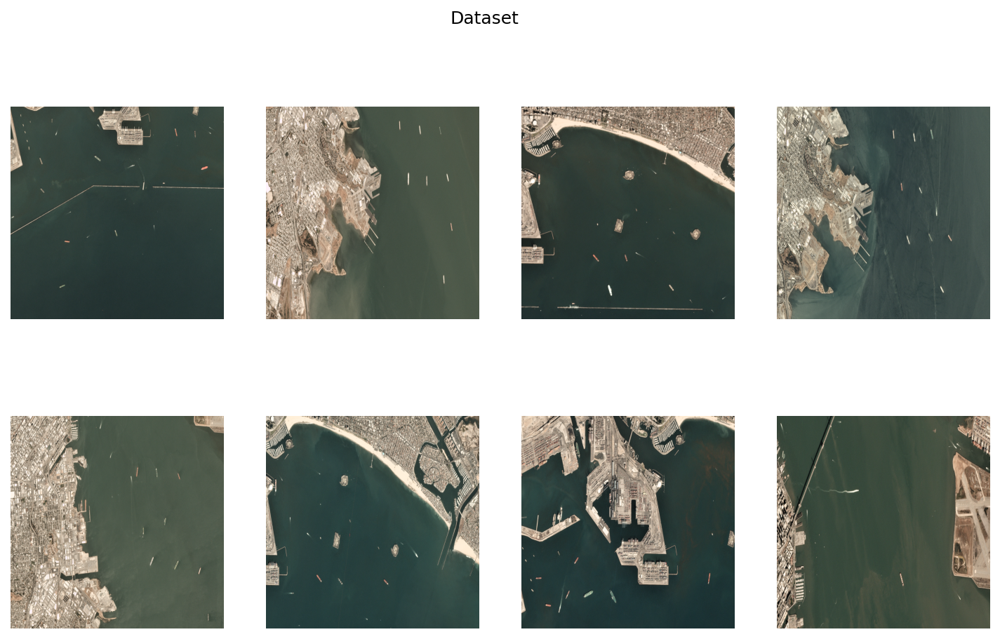

In [27]:
## Loading the dataset an viewing it with help of the
## helper functions mentioned above

images = load_images(path)
plot_images(images, "Dataset")

## Applying Canny Edge Detection


## Using HSV Spectrum

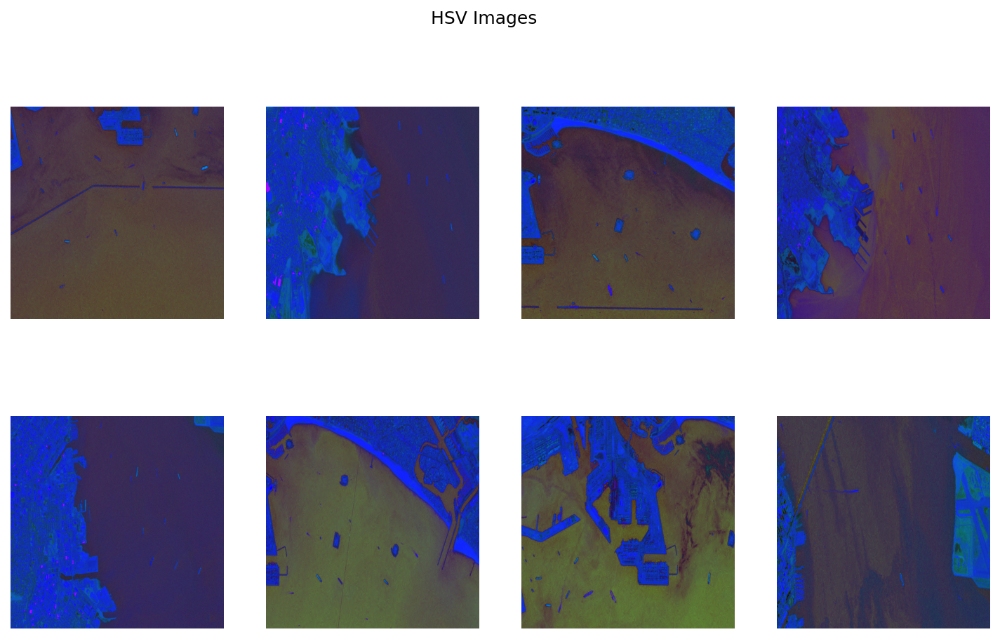

In [28]:
## Loading the images in HSV format and viewing it for comparing
## them with regular RGB images, to see if there is any difference.
## HSV images helped us a lot in differentiating the water bodies
## from other objects in the images.

hsv_images = load_images(path, color='HSV', gray=False)
plot_images(hsv_images, title="HSV Images")

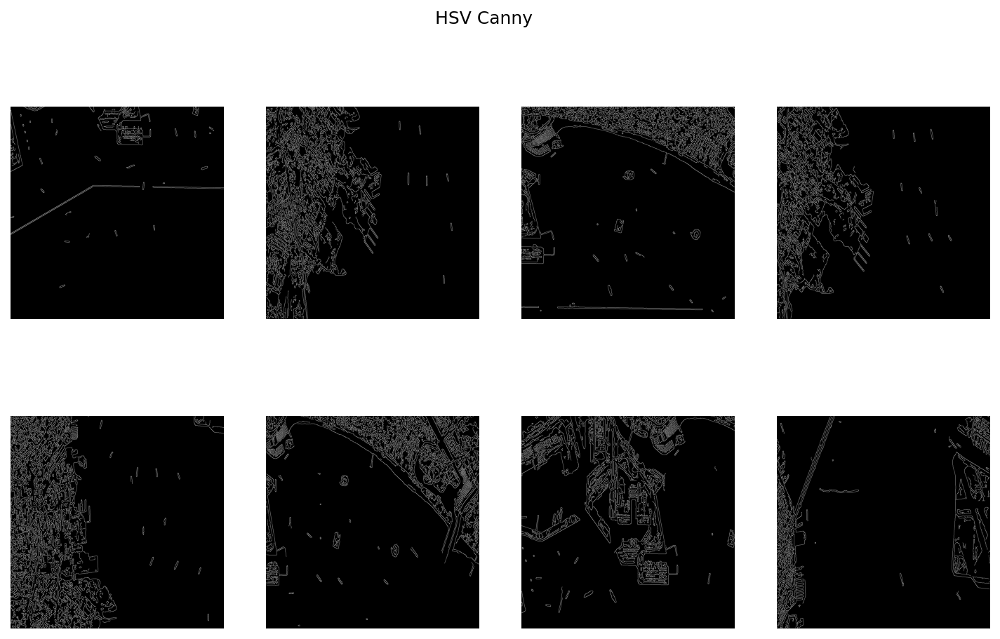

In [29]:
## Applyin GaussinBlur and Canny Edge Detection on the HSV images
## to recognize the edges and objects in the figure. This later helped
## us in seperating water bodies with other objects.

hsv_blur = [cv.GaussianBlur(image, (11,11), 0) for image in hsv_images]
canny_hsv = [cv.Canny(image, 10, 100) for image in hsv_blur]
plot_images(canny_hsv, title="HSV Canny", cmap="gray")

In [30]:
## median_smooth function is completely custom image smoothing
## techniques that applies median smoothing on the images. We
## are planning to implement this on the final feature maps or
## predictions to remove any noise present in them.

def median_smooth(feature_map, kernel_size=3, pad=True, stride=1):
  n = feature_map.shape[0]
  padding = kernel_size - 2
  op = floor((n + (2 * padding) - kernel_size) / stride) + 1
  output = np.zeros((op, op), dtype=np.uint8)
  feature_map = np.pad(feature_map, padding, 'reflect')
  for row in range(op):
    for col in range(kernel_size-1, op):
      median = np.median(feature_map[row, col])
      output[row, col] = median

  return output

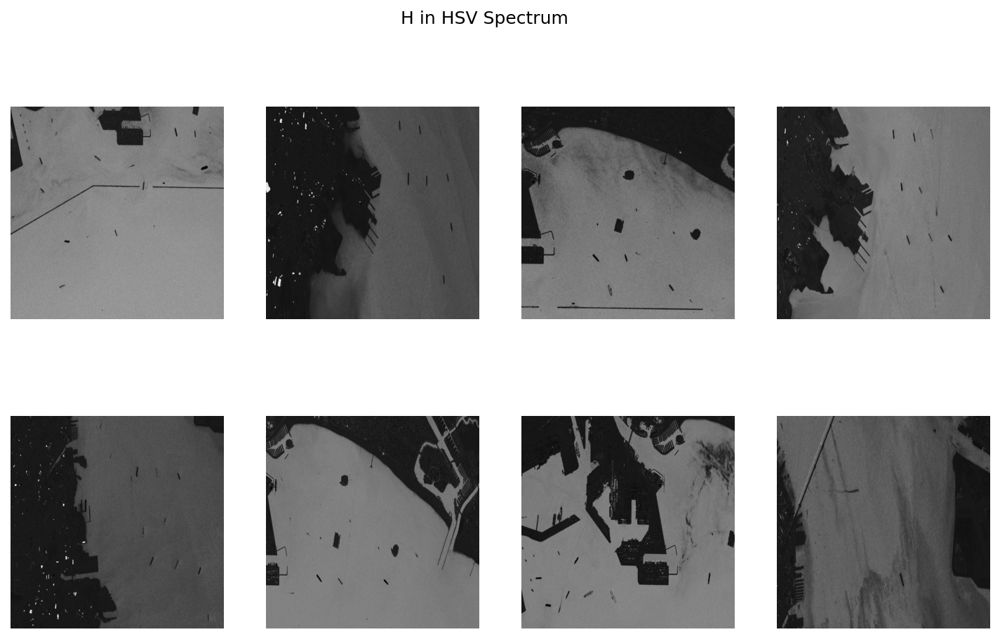

In [31]:
## Plotting the H cahnnel in HSV image to if we can gain any information.

plot_images([
    image[:,:,0]
    for image in hsv_images
], title="H in HSV Spectrum", cmap='gray')

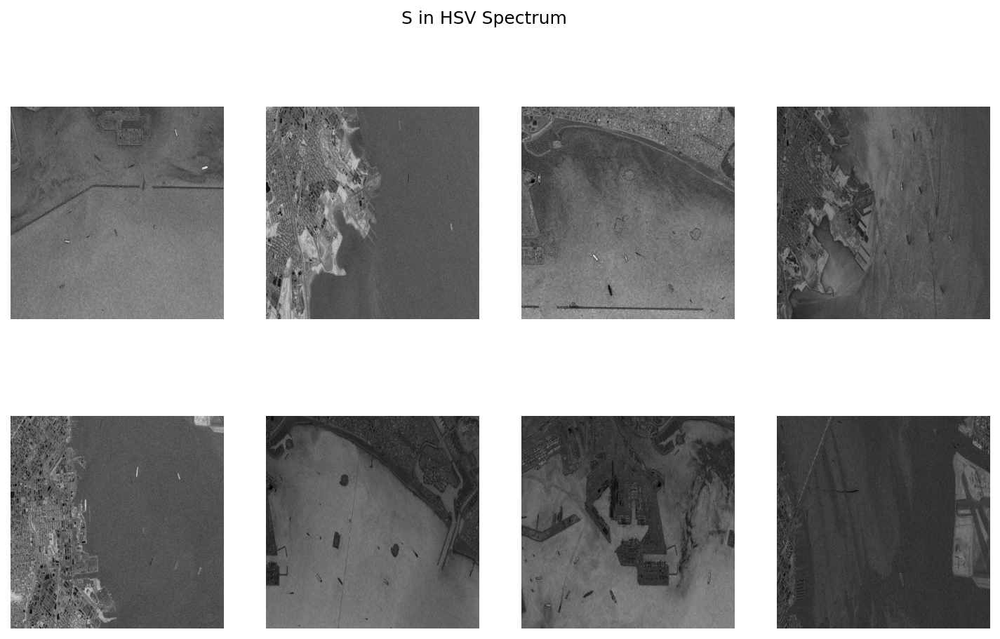

In [32]:
## Plotting the S cahnnel in HSV image to if we can gain any information.

plot_images([
    image[:,:,1]
    for image in hsv_images
], title="S in HSV Spectrum", cmap='gray')

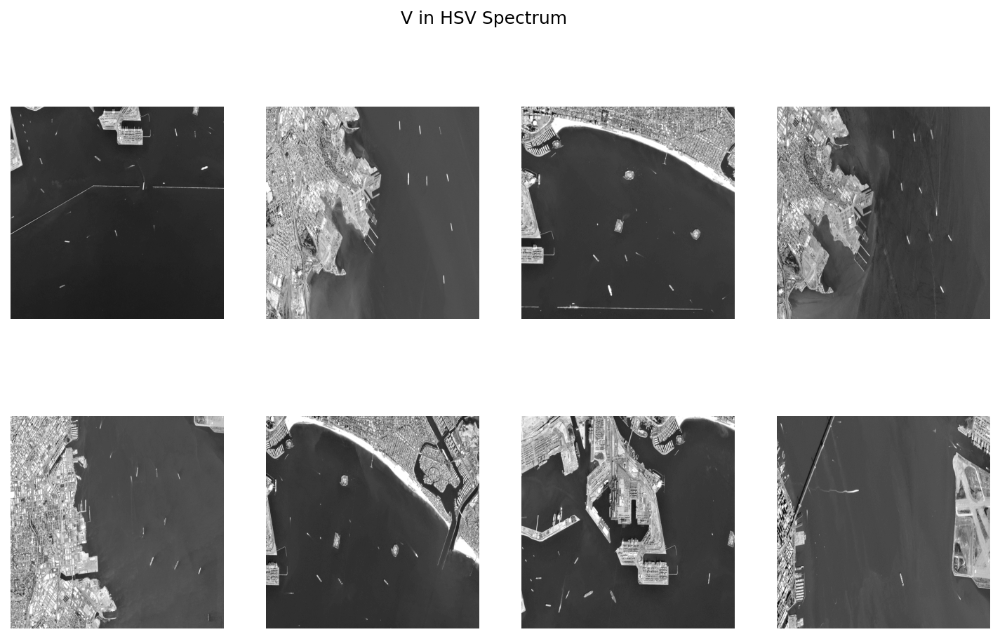

In [33]:
## Plotting the V cahnnel in HSV image to if we can gain any information.

plot_images([
    image[:,:,2]
    for image in hsv_images
], title="V in HSV Spectrum", cmap='gray')

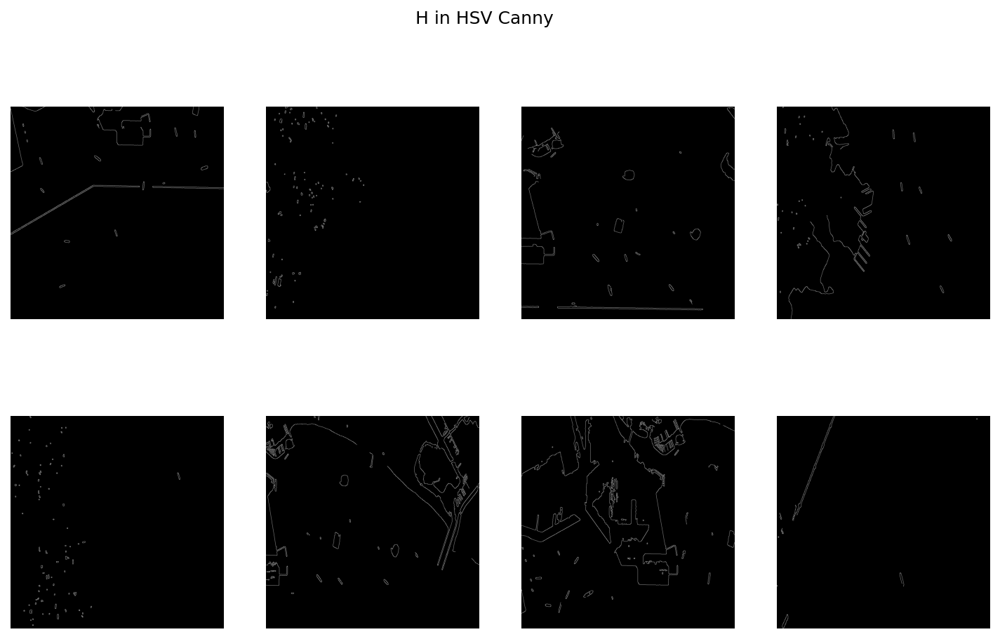

In [34]:
## Applying Gaussian Blur and Canny Edge Detection on the H channel of the images

H_blur = [cv.GaussianBlur(image[:,:,0], (9,9), 0) for image in hsv_images]
canny_H = [cv.Canny(image, 10, 100) for image in H_blur]
plot_images(canny_H, title="H in HSV Canny", cmap="gray")

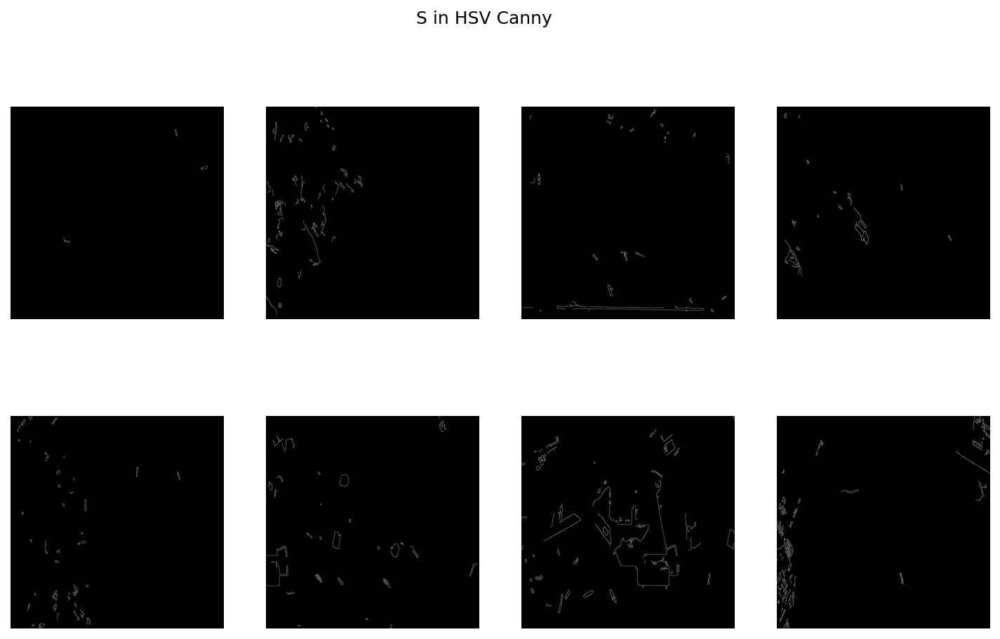

In [35]:
## Applying Gaussian Blur and Canny Edge Detection on the S channel of the images

S_blur = [cv.GaussianBlur(image[:,:,1], (9,9), 0) for image in hsv_images]
canny_S = [cv.Canny(image, 10, 100) for image in S_blur]
plot_images(canny_S, title="S in HSV Canny", cmap="gray")

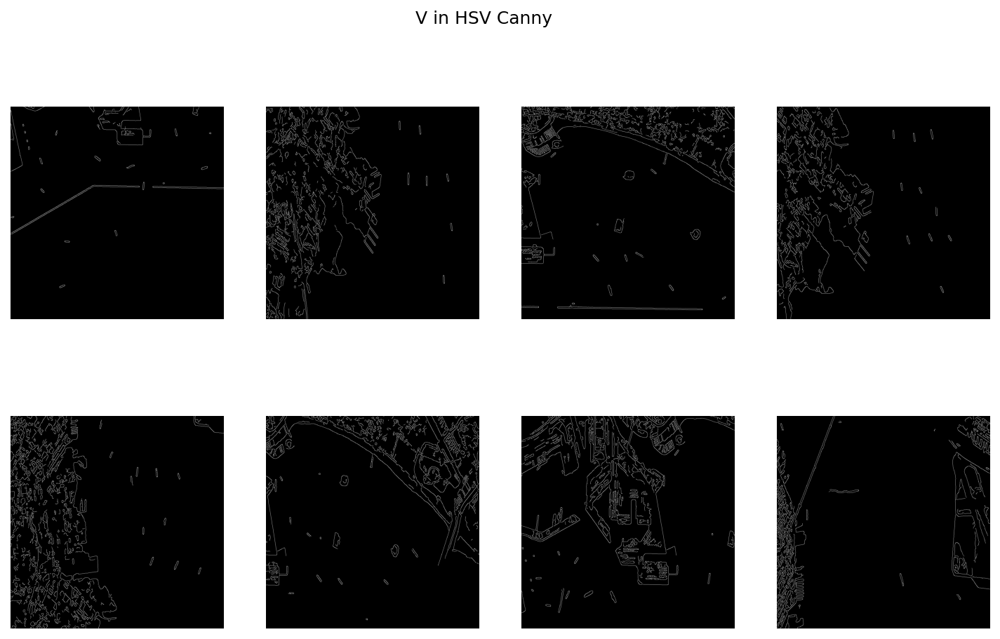

In [36]:
## Applying Gaussian Blur and Canny Edge Detection on the V channel of the images

V_blur = [cv.GaussianBlur(image[:,:,2], (15,15), 0) for image in hsv_images]
canny_V = [cv.Canny(image, 10, 100) for image in V_blur]
plot_images(canny_V, title="V in HSV Canny", cmap="gray")

In [37]:
## COmbining the feature maps from the Canny Edge Detection of H,S and V
## channels by super imposing them on each other. This gave us the final
## Edge Detection map shown below.

HSV_canny = zip(canny_H, canny_S, canny_V)
HSV_canny = [
    np.clip(sum(list(HSV)), 0, 1)
    for HSV in HSV_canny
]

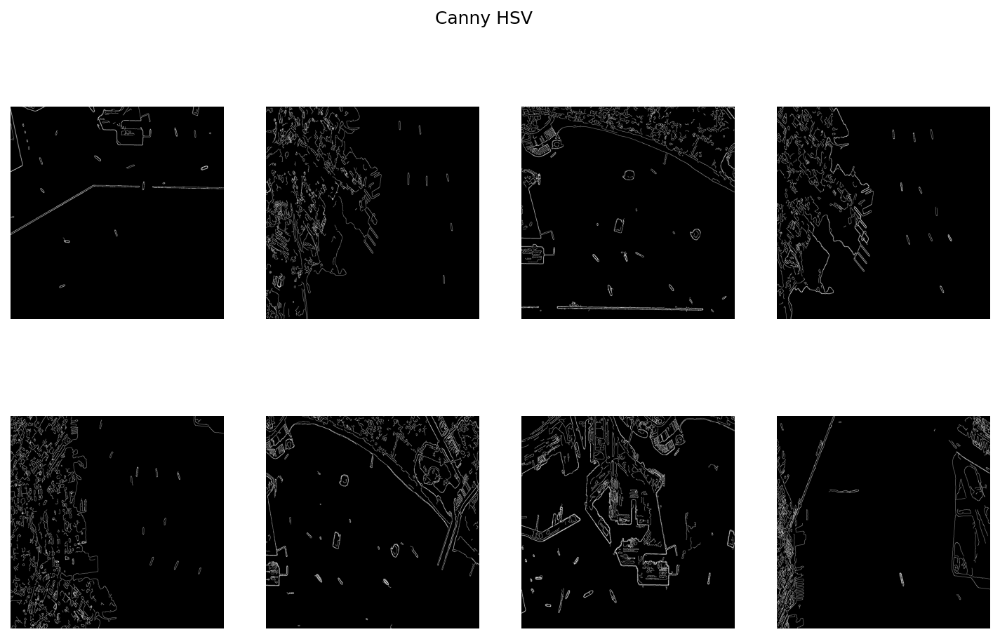

In [38]:
plot_images(HSV_canny, title="Canny HSV", cmap='gray')

## Applying Thresholding

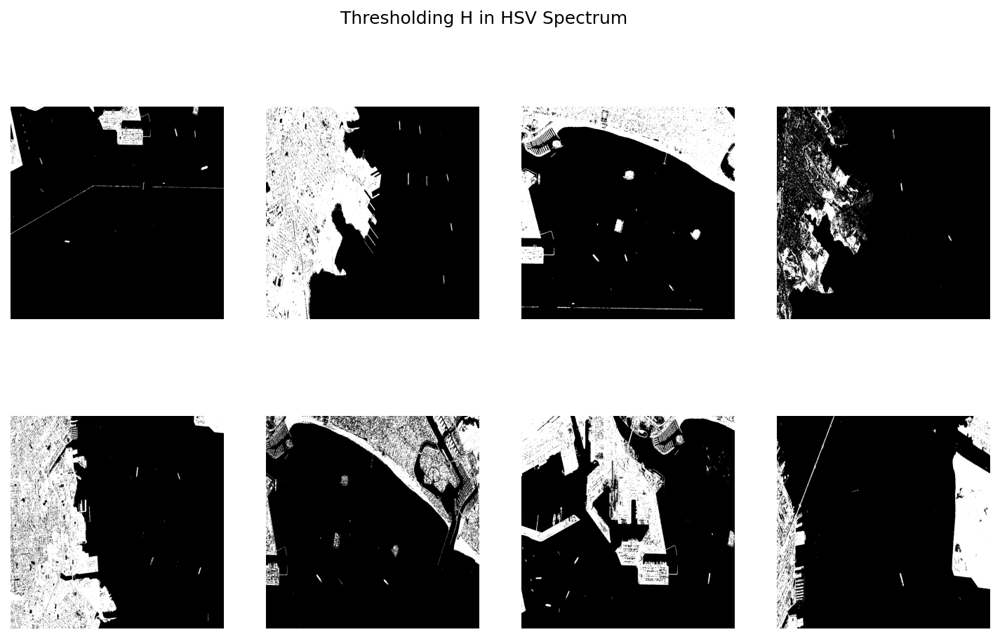

In [39]:
## The edge detection on H,S and V channels gave better results, so
## we are moving forward in that direction. No we have applied thresholding
## on seperate channles of HSV and clipped then in that range.


## This part of the code clips H channl in the range of [0 - 20]

plot_images([
    image[:,:,0] < 20
    for image in hsv_images
], title="Thresholding H in HSV Spectrum", cmap='gray')

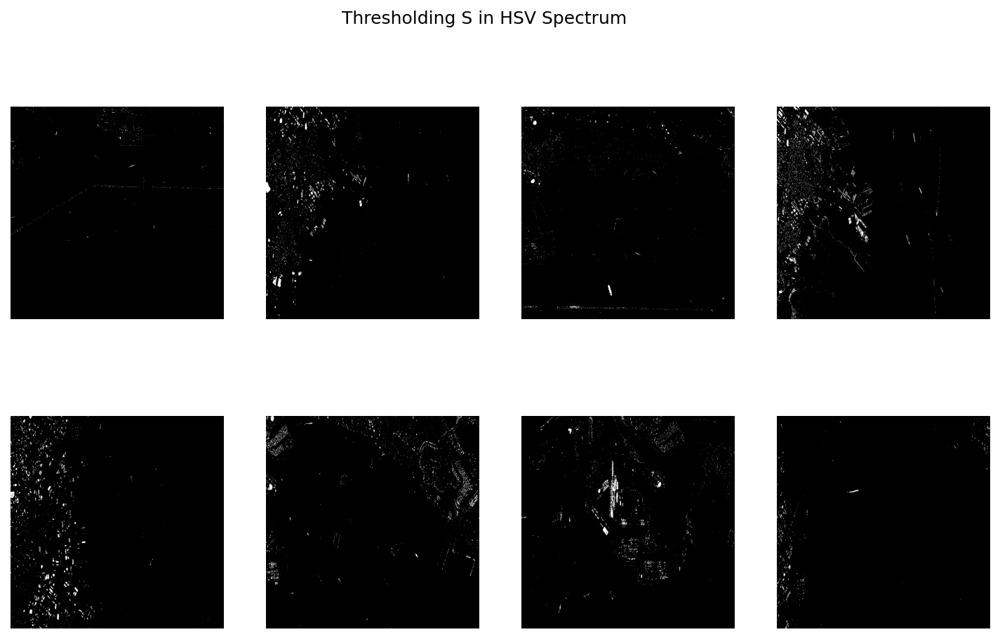

In [40]:
## This part of the code clips S channl in the range of [0 - 25]

plot_images([
    image[:,:,1] < 25
    for image in hsv_images
], title="Thresholding S in HSV Spectrum", cmap='gray')

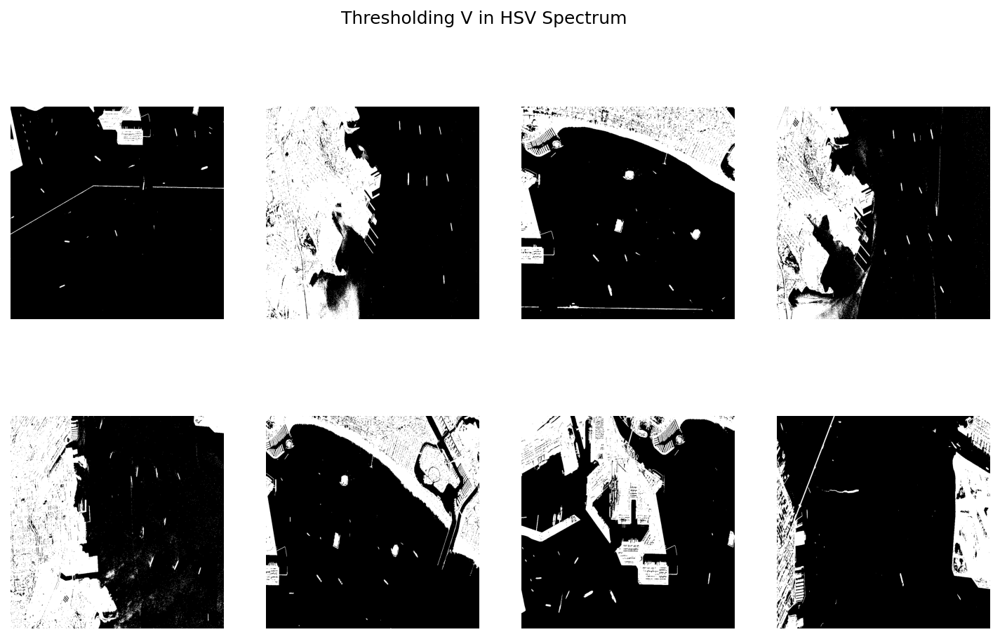

In [41]:
## This part of the code clips H channl in the range of [100 - 255]

plot_images([
    image[:,:,2] > 100
    for image in hsv_images
], title="Thresholding V in HSV Spectrum", cmap='gray')

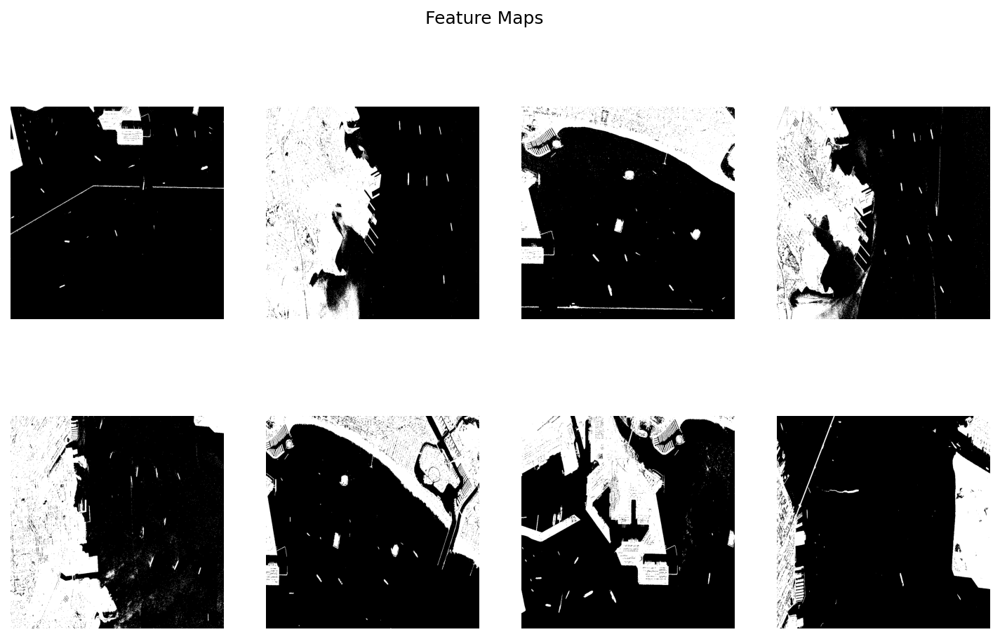

In [42]:
## We are combining the thresholded feature maps of each channel
## by super imposing them on each other. This gave us the final
## feature maps.

feature_maps = []
for image in hsv_images:
  map = (image[:,:,0] < 20) + (image[:,:,1] < 25) + (image[:,:,2] > 100)
  map = np.clip(map, 0, 1)
  feature_maps.append(map)


plot_images(feature_maps, title="Feature Maps", cmap='gray')